In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats

# 데이터 로드 및 전처리
data = pd.read_csv('data/bsmax_0_1.csv', delimiter='\t')
data = data.dropna()  # 결측값 제거
data = data[(np.abs(stats.zscore(data)) < 3).all(axis=1)]  # 이상값 제거

data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

# 데이터 스케일링
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [2]:
# 하이퍼파라미터 튜닝
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# XGBoost 하이퍼파라미터 그리드 설정
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb = XGBRegressor(random_state=42)
grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_xgb.fit(X_train, y_train)
best_xgb_model = grid_search_xgb.best_estimator_

# LightGBM 하이퍼파라미터 그리드 설정
param_grid_lgb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

lgb = LGBMRegressor(random_state=42)
grid_search_lgb = GridSearchCV(estimator=lgb, param_grid=param_grid_lgb, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_lgb.fit(X_train, y_train)
best_lgb_model = grid_search_lgb.best_estimator_

# CatBoost 하이퍼파라미터 그리드 설정
param_grid_cat = {
    'iterations': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [3, 5, 7],
    'subsample': [0.8, 1.0]
}

cat = CatBoostRegressor(random_state=42, verbose=0)
grid_search_cat = GridSearchCV(estimator=cat, param_grid=param_grid_cat, scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=1)
grid_search_cat.fit(X_train, y_train)
best_cat_model = grid_search_cat.best_estimator_


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Fitting 5 folds for each of 108 candidates, totalling 540 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005471 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5010
[LightGBM] [Info] Total Bins 5004
[LightGBM] [Info] Number of data points in the train set: 1218, number of used features: 27
[LightGBM] [Info] Number of data points in the train set: 1218, number of used features: 27
[LightGBM] [Info] Start training from score -14.037767
[LightGBM] [Info] Start training from score -29.167488
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bi

/opt/homebrew/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


In [3]:
# Stacking Ensemble 모델
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression

# Stacking Ensemble 모델 정의
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

# 모델 학습
stacking_model.fit(X_train, y_train)

# 예측
y_pred_stacking = stacking_model.predict(X_test)

# 모델 평가
mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000384 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [4]:
# 모델 특성 중요도 분석
xgb_model = XGBRegressor(colsample_bytree=1.0, learning_rate=0.05, max_depth=5, n_estimators=200, subsample=0.8, random_state=42)
lgb_model = LGBMRegressor(n_estimators=200, learning_rate=0.05, max_depth=5, subsample=0.8, colsample_bytree=1.0, random_state=42)
cat_model = CatBoostRegressor(iterations=200, learning_rate=0.05, depth=5, subsample=0.8, verbose=0, random_state=42)
lr_model = LinearRegression()
xgb_model.fit(X_train, y_train)
lgb_model.fit(X_train, y_train)
cat_model.fit(X_train, y_train)

importances_xgb = xgb_model.feature_importances_
importances_lgb = lgb_model.feature_importances_
importances_cat = cat_model.feature_importances_

# 평균 특성 중요도 계산
mean_importances = (importances_xgb + importances_lgb + importances_cat) / 3
print("Mean importances len:", len(mean_importances))
# 중요도가 높은 상위 특성 선택
important_features = np.argsort(mean_importances)[::-1][:10]  # 상위 10개의 중요한 특성 선택

print("Important features indices:", important_features)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [5]:
# 데이터 전처리 및 스케일링
data_processed = data.drop(columns=['ymd', 'rtn'])
X = data_processed
y = data['rtn']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 학습 데이터와 테스트 데이터로 분할
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# 모델 정의 및 학습
stacking_model = StackingRegressor(
    estimators=[('xgb', best_xgb_model), ('lgb', best_lgb_model), ('cat', best_cat_model)],
    final_estimator=LinearRegression()
)

stacking_model.fit(X_train, y_train)
y_pred_stacking = stacking_model.predict(X_test)

mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f'Stacking Ensemble Test Mean Squared Error: {mse_stacking}')
print(f'Stacking Ensemble R² Score: {r2_stacking}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5053
[LightGBM] [Info] Number of data points in the train set: 1523, number of used features: 27
[LightGBM] [Info] Start training from score -37.177938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [6]:
from sklearn.ensemble import GradientBoostingRegressor

# 모델 정의
gbr_model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=5, random_state=42)

# 모델 학습
gbr_model.fit(X_train, y_train)
y_pred_gbr = gbr_model.predict(X_test)

# 모델 평가
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)

print(f'Gradient Boosting Test Mean Squared Error: {mse_gbr}')
print(f'Gradient Boosting R² Score: {r2_gbr}')


Gradient Boosting Test Mean Squared Error: 3570287.208625924
Gradient Boosting R² Score: 0.48807187206843605


In [7]:
from sklearn.model_selection import cross_val_score

# 교차 검증을 통한 모델 성능 평가
cv_scores = cross_val_score(stacking_model, X_scaled, y, cv=10, scoring='r2')

print(f'Cross-Validated R² Scores: {cv_scores}')
print(f'Average Cross-Validated R² Score: {np.mean(cv_scores)}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5078
[LightGBM] [Info] Number of data points in the train set: 1713, number of used features: 27
[LightGBM] [Info] Start training from score 9.059545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

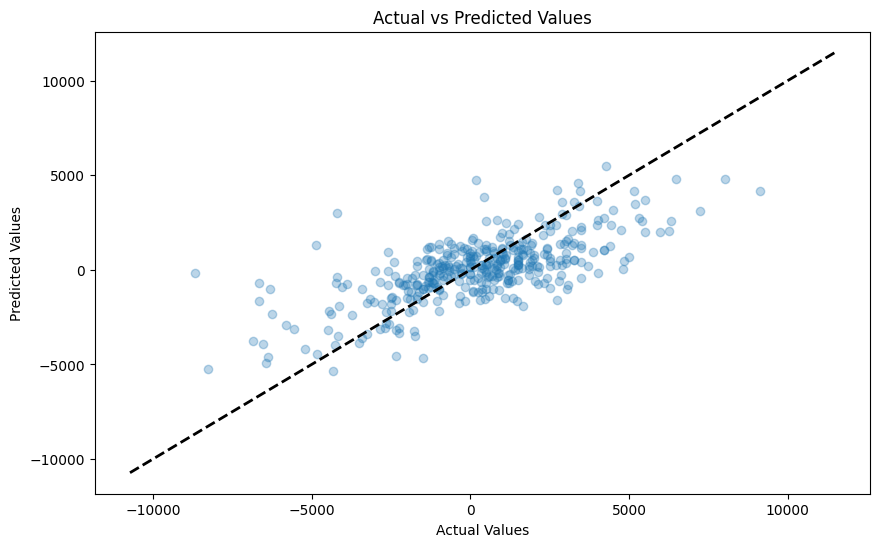

In [8]:
import matplotlib.pyplot as plt

# 실제 값과 예측 값의 분포 비교
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_gbr, alpha=0.3)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.show()

Stacking Ensemble Train Mean Squared Error: 294184.4405565039
Stacking Ensemble Train R² Score: 0.9601478049546233
Stacking Ensemble Test Mean Squared Error: 3570287.208625924
Stacking Ensemble Test R² Score: 0.48807187206843605
Cross-Validated R² Scores: [0.34036299 0.07044669 0.37369771 0.41465501 0.43383206]
Average Cross-Validated R² Score: 0.3265988936318246


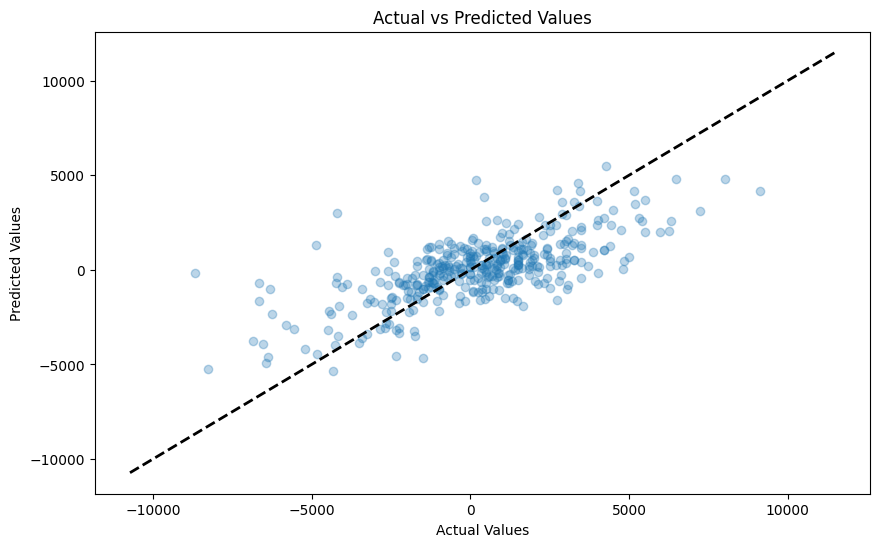

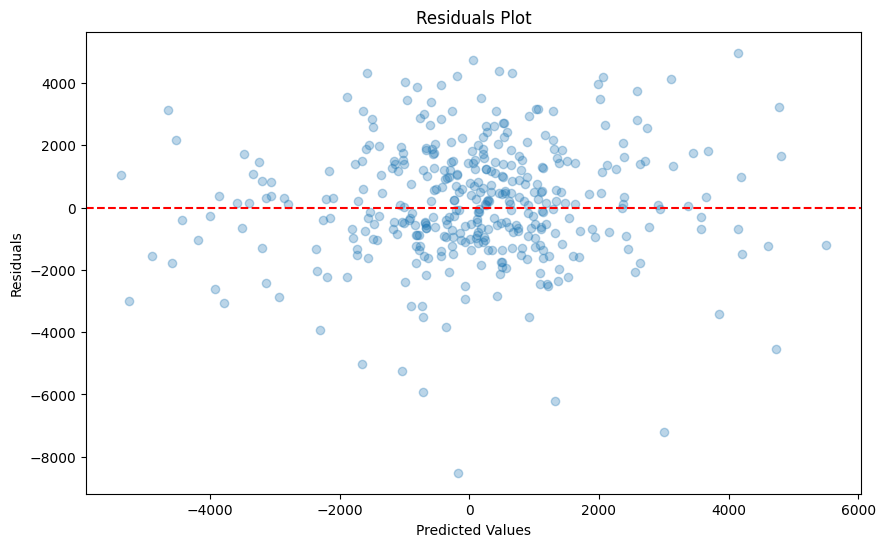

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1116
[LightGBM] [Info] Number of data points in the train set: 152, number of used features: 27
[LightGBM] [Info] Start training from score -77.940789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

/opt/homebrew/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

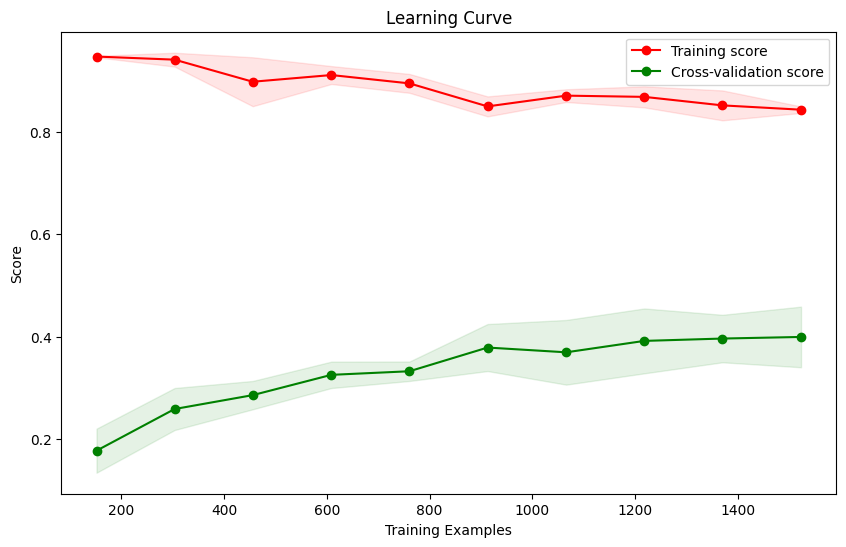

AttributeError: 'GradientBoostingRegressor' object has no attribute 'final_estimator_'

In [9]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, learning_curve
import seaborn as sns
# 학습 데이터 성능 평가
y_train_pred = gbr_model.predict(X_train)
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)
print(f'Stacking Ensemble Train Mean Squared Error: {mse_train}')
print(f'Stacking Ensemble Train R² Score: {r2_train}')

# 테스트 데이터 성능 평가
y_pred_stacking = gbr_model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_stacking)
r2_test = r2_score(y_test, y_pred_stacking)
print(f'Stacking Ensemble Test Mean Squared Error: {mse_test}')
print(f'Stacking Ensemble Test R² Score: {r2_test}')

# 교차 검증 성능 평가
cv_scores = cross_val_score(gbr_model, X_scaled, y, cv=5, scoring='r2')
print(f'Cross-Validated R² Scores: {cv_scores}')
print(f'Average Cross-Validated R² Score: {np.mean(cv_scores)}')

# 시각화 1: 실제 값과 예측 값의 분포 비교
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stacking, alpha=0.3)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=2)
plt.show()

# 시각화 2: 잔차 분석 (Residuals Plot)
residuals = y_test - y_pred_stacking
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_stacking, residuals, alpha=0.3)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# 시각화 3: 학습 곡선 (Learning Curve)
train_sizes, train_scores, test_scores = learning_curve(stacking_model, X_scaled, y, cv=5, scoring='r2', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color='r')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color='g')
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# 시각화 4: 특성 중요도 (Feature Importances)
final_model = gbr_model.final_estimator_
if hasattr(final_model, 'feature_importances_'):
    importances = final_model.feature_importances_
    features = data_processed.columns
    feature_importances = pd.Series(importances, index=features).sort_values(ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(x=feature_importances, y=feature_importances.index)
    plt.xlabel('Feature Importance Score')
    plt.ylabel('Features')
    plt.title('Feature Importances')
    plt.show()
else:
    print("The final model does not have feature_importances_ attribute.")
# 시각화 4: 각 개별 모델의 특성 중요도 (Feature Importances)
def plot_feature_importances(model, model_name):
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        features = data_processed.columns
        feature_importances = pd.Series(importances, index=features).sort_values(ascending=False)

        plt.figure(figsize=(10, 6))
        sns.barplot(x=feature_importances, y=feature_importances.index)
        plt.xlabel('Feature Importance Score')
        plt.ylabel('Features')
        plt.title(f'{model_name} Feature Importances')
        plt.show()
    else:
        print(f"The model {model_name} does not have feature_importances_ attribute.")

plot_feature_importances(gbr_model, 'Gradient Boosting')

/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


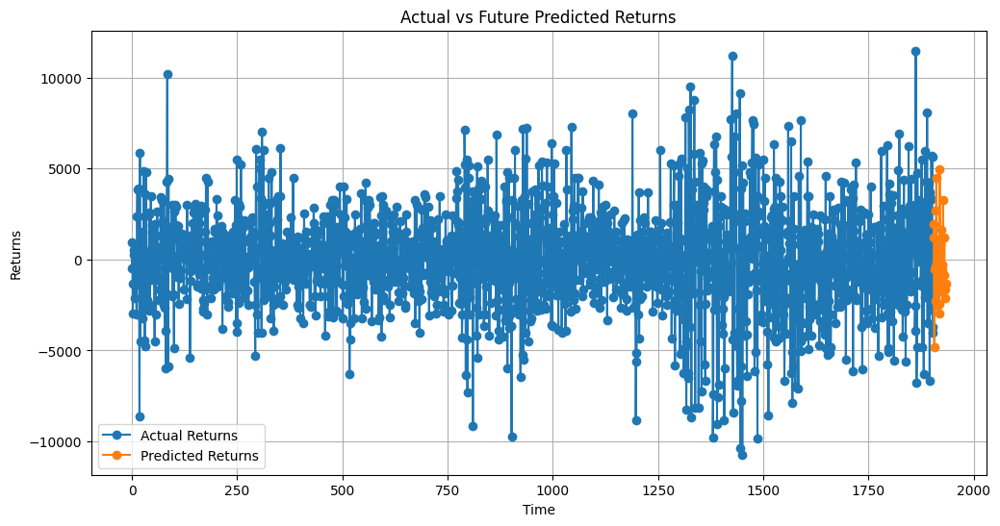

In [10]:
# 미래 데이터 생성
num_future_samples = 30
future_data = np.random.normal(loc=np.mean(X, axis=0), scale=np.std(X, axis=0), size=(num_future_samples, X.shape[1]))

# 미래 데이터 스케일링 (학습 시 사용한 스케일러를 사용)
X_future_scaled = scaler.transform(future_data)

# 모델을 사용하여 예측 수행
future_predictions = gbr_model.predict(X_future_scaled)

# 원본 데이터의 실제 값과 비교하여 시각화
plt.figure(figsize=(12, 6))

# 원본 데이터의 실제 값 플롯
plt.plot(np.arange(len(y)), y, label='Actual Returns', marker='o')

# 미래 예측 값 플롯
plt.plot(np.arange(len(y), len(y) + num_future_samples), future_predictions, label='Predicted Returns', marker='o')

# 그래프 설정
plt.xlabel('Time')
plt.ylabel('Returns')
plt.title('Actual vs Future Predicted Returns')
plt.legend()
plt.grid(True)
plt.show()
